In [1]:
%run ./Midterm_db_connection.ipynb

#### Initial Look at Flight_data

In [2]:
flight_data_2019 = """
                  SELECT 
                    mkt_unique_carrier,
                    branded_code_share,
                    mkt_carrier_fl_num, op_unique_carrier,
                    tail_num, op_carrier_fl_num,
                    origin_city_name,dest_city_name,
                    origin_airport_id, dest_airport_id,
                    crs_dep_time, dep_time, dep_delay,
                    taxi_out, wheels_off, wheels_on,
                    taxi_in,
                    crs_arr_time,
                    arr_time, arr_delay,
                    cancelled, cancellation_code,
                    diverted,
                    dup,
                    crs_elapsed_time, actual_elapsed_time,
                    air_time,
                    flights,
                    distance,
                    carrier_delay, weather_delay, nas_delay, security_delay, late_aircraft_delay,
                    first_dep_time, total_add_gtime, longest_add_gtime,
                    fl_date,
                    date_part('year', TO_DATE(fl_date,'YYYY-MM-DD')) as year,
                    date_part('month', TO_DATE(fl_date,'YYYY-MM-DD')) as month    
                  FROM flights
                  WHERE date_part('year', TO_DATE(fl_date,'YYYY-MM-DD')) = 2019
                  """
flights_2019 = execute_read_query(con,flight_data_2019)

Save Dataframe

In [3]:
import pickle

filename = 'flight_2019'
outfile = open(filename,'wb')

pickle.dump(flights_2019,outfile)
outfile.close()

Load Dataframe from Saved Pickle File

In [2]:
import pickle
infile = open('flight_2019','rb')
flight_2019 = pickle.load(infile)
infile.close()

In [3]:
flight_2019.head()

,mkt_unique_carrier,branded_code_share,mkt_carrier_fl_num,op_unique_carrier,tail_num,op_carrier_fl_num,origin_city_name,dest_city_name,origin_airport_id,dest_airport_id,...,weather_delay,nas_delay,security_delay,late_aircraft_delay,first_dep_time,total_add_gtime,longest_add_gtime,fl_date,year,month
0,DL,DL_CODESHARE,3600,OO,N549CA,3600,"Detroit, MI","Grand Rapids, MI",11433,11986,...,NaN,NaN,NaN,NaN,None,NaN,NaN,2019-10-01,2019.0,10.0
1,AA,AA_CODESHARE,5121,OH,N598NN,5121,"Columbia, SC","Charlotte, NC",10868,11057,...,NaN,NaN,NaN,NaN,None,NaN,NaN,2019-10-01,2019.0,10.0
2,AA,AA_CODESHARE,5122,OH,N248PS,5122,"Columbia, SC","Washington, DC",10868,11278,...,NaN,NaN,NaN,NaN,None,NaN,NaN,2019-10-01,2019.0,10.0
3,AA,AA_CODESHARE,5122,OH,N248PS,5122,"Washington, DC","Columbia, SC",11278,10868,...,NaN,NaN,NaN,NaN,None,NaN,NaN,2019-10-01,2019.0,10.0
4,AA,AA_CODESHARE,5123,OH,N249PS,5123,"Myrtle Beach, SC","Philadelphia, PA",13577,14100,...,NaN,NaN,NaN,NaN,None,NaN,NaN,2019-10-01,2019.0,10.0


In [4]:
print("Number of rows for 2019", len(flight_2019))

Number of rows for 2019 8091684


### Create a new feature 'total_delay' for each flight

### New dataframe with a smaller sample of 1000,000 records

In [61]:
flight_sample = flight_2019.sample(n=1000000, random_state=1)

### Replace Nulls in delay columns with 0

In [62]:
flight_sample['dep_delay'] = flight_sample['dep_delay'].fillna(0)
flight_sample['arr_delay'] = flight_sample['arr_delay'].fillna(0)
flight_sample['carrier_delay'] = flight_sample['carrier_delay'].fillna(0)
flight_sample['weather_delay'] = flight_sample['weather_delay'].fillna(0)
flight_sample['nas_delay'] = flight_sample['nas_delay'].fillna(0)
flight_sample['security_delay'] = flight_sample['security_delay'].fillna(0)
flight_sample['late_aircraft_delay'] = flight_sample['late_aircraft_delay'].fillna(0)

### Create the total_delays column

In [63]:
flight_sample['total_delay'] = flight_sample.apply(lambda x: ((x['dep_delay'] + 
                                                               x['arr_delay'] +
                                                               x['carrier_delay'] +
                                                               x['weather_delay'] + 
                                                               x['nas_delay'] + 
                                                               x['security_delay'] +
                                                               x['late_aircraft_delay'])),  axis=1)

### Create is_delay column

In [64]:
flight_sample['is_delay'] = flight_sample.apply(lambda x: (0 if x['total_delay'] <= 0 else 1),  axis=1)

#### Export Sample data

In [65]:
import pickle
sample_file = 'flight_2019_sample'
sample_outfile = open(sample_file,'wb')

pickle.dump(flight_sample,sample_outfile)
sample_outfile.close()

### Separate Data for Weather Analysis

In [52]:
delayed_flights = flight_sample.query('is_delay == "1"')
early_flights = flight_sample.query('is_delay == "0"')

In [53]:
# Get most frequently early destinations 
most_frequently_early = early_flights['dest_city_name'].value_counts().index.tolist()[:15]
# Get most frequently delayed destinations 
most_frequently_delayed = delayed_flights['dest_city_name'].value_counts().index.tolist()[:15]

In [54]:
most_frequently_early

['Chicago, IL',
 'Atlanta, GA',
 'Dallas/Fort Worth, TX',
 'New York, NY',
 'Denver, CO',
 'Charlotte, NC',
 'Washington, DC',
 'Los Angeles, CA',
 'Houston, TX',
 'Detroit, MI',
 'Seattle, WA',
 'Phoenix, AZ',
 'Minneapolis, MN',
 'Las Vegas, NV',
 'San Francisco, CA']

In [55]:
most_frequently_delayed

['Chicago, IL',
 'Atlanta, GA',
 'New York, NY',
 'Dallas/Fort Worth, TX',
 'Denver, CO',
 'Los Angeles, CA',
 'Houston, TX',
 'Charlotte, NC',
 'Washington, DC',
 'Seattle, WA',
 'San Francisco, CA',
 'Newark, NJ',
 'Phoenix, AZ',
 'Las Vegas, NV',
 'Boston, MA']

In [56]:
# Export Delayed Flight Location list Data
import pickle

filename = 'most_freq_delayed_flight_locations_2019'
outfile = open(filename,'wb')

pickle.dump(most_frequently_delayed,outfile)
outfile.close()

In [57]:
# Export Early Flight Location list Data
import pickle

filename = 'most_freq_early_flight_locations_2019'
outfile = open(filename,'wb')

pickle.dump(most_frequently_early,outfile)
outfile.close()

In [30]:
flight_sample.head()

,mkt_unique_carrier,branded_code_share,mkt_carrier_fl_num,op_unique_carrier,tail_num,op_carrier_fl_num,origin_city_name,dest_city_name,origin_airport_id,dest_airport_id,...,security_delay,late_aircraft_delay,first_dep_time,total_add_gtime,longest_add_gtime,fl_date,year,month,total_delay,is_delay
5817519,DL,DL_CODESHARE,4001,OO,N506CA,4001,"Traverse City, MI","Minneapolis, MN",15380,13487,...,0.0,0.0,None,NaN,NaN,2019-05-23,2019.0,5.0,0.0,0
3440584,DL,DL_CODESHARE,4316,OO,N685BR,4316,"Salt Lake City, UT","St. George, UT",14869,14794,...,0.0,0.0,None,NaN,NaN,2019-12-05,2019.0,12.0,-20.0,0
2213756,DL,DL,2152,DL,N327NW,2152,"Atlanta, GA","Washington, DC",10397,11278,...,0.0,0.0,None,NaN,NaN,2019-02-06,2019.0,2.0,20.0,1
4372882,AA,AA,445,AA,N580UW,445,"Phoenix, AZ","Los Angeles, CA",14107,12892,...,0.0,0.0,None,NaN,NaN,2019-09-17,2019.0,9.0,-13.0,0
2224046,AA,AA_CODESHARE,4040,MQ,N925AE,4040,"Shreveport, LA","Dallas/Fort Worth, TX",14814,11298,...,0.0,0.0,None,NaN,NaN,2019-02-06,2019.0,2.0,-15.0,0


### Exclude flights that were early (have a negative total delay)

In [33]:
flight_delays_sample = flight_sample[flight_sample['total_delay'] > 0]

In [34]:
# get data that is within +3 to -3 standard deviations in the column 'Data'.
flight_delays_no_outlier = flight_delays_sample[abs(flight_delays_sample.total_delay - flight_delays_sample.total_delay.mean()) <= (3*flight_delays_sample.total_delay.std())]

flight_sample_no_outlier = flight_sample[abs(flight_sample.total_delay - flight_sample.total_delay.mean()) <= (3*flight_sample.total_delay.std())]

### Plot the histogram of delays

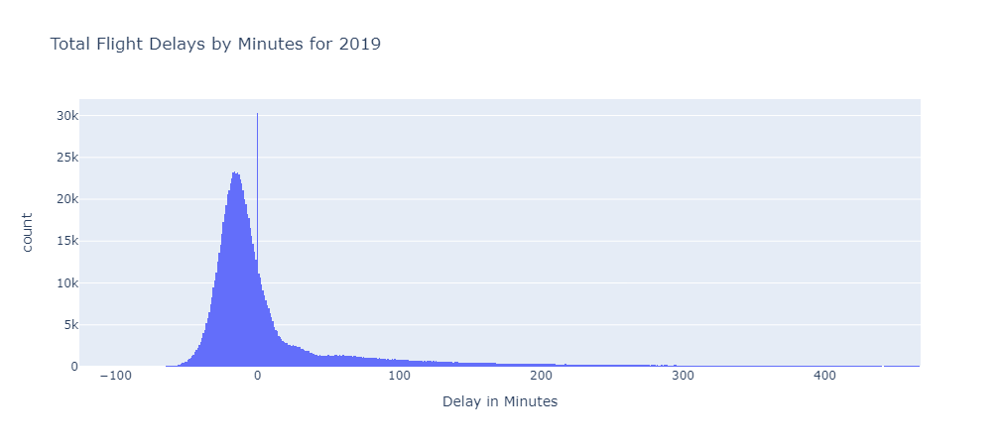

In [43]:
import plotly.express as px

fig = px.histogram(
        flight_sample_no_outlier, 
        title='Total Flight Delays by Minutes for 2019',
        x="total_delay",
        labels = {'total_delay':'Delay in Minutes'})
fig.show()

In [36]:
print("Median flight delay", flight_sample_no_outlier.total_delay.median(axis=0))

Median flight delay -9.0


### Get Median Delays by Month

In [48]:
flight_delays_by_month = flight_sample[flight_sample['is_delay'] == 1].groupby('month').month.agg(count=('count')).reset_index()
flight_early_by_month = flight_sample[flight_sample['is_delay'] == 0].groupby('month').month.agg(count=('count')).reset_index()

,month,count
0,1.0,52368
1,2.0,43712
2,3.0,56752
3,4.0,56119
4,5.0,55519
5,6.0,50459
6,7.0,56797
7,8.0,56876
8,9.0,59456
9,10.0,58586


### Plot the Delays per month

In [49]:
# Export Monthly early Flights Data
import pickle

filename = 'Monthly_flight_early'
outfile = open(filename,'wb')

pickle.dump(flight_early_by_month,outfile)
outfile.close()

In [39]:
# Export Monthly Delayed Flights Data
import pickle

filename = 'Monthly_flight_delays'
outfile = open(filename,'wb')

pickle.dump(flight_delays_by_month,outfile)
outfile.close()

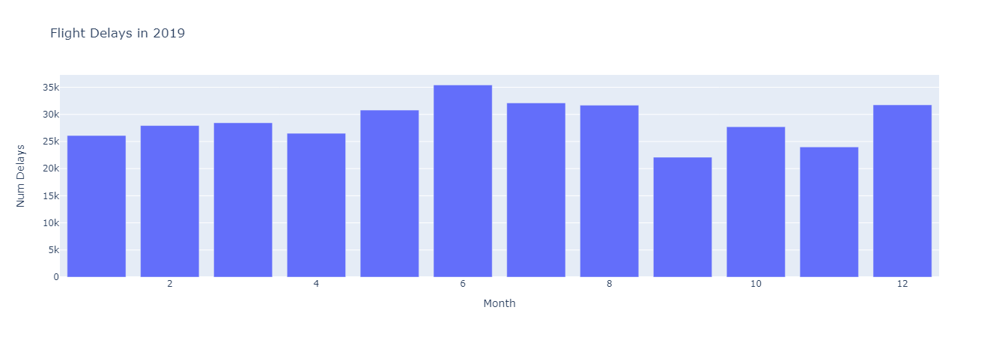

In [38]:
fig = px.bar(flight_delays_by_month, 
             title='Flight Delays in 2019',
             x='month', 
             y='count',
             labels = {'count': 'Num Delays', 'month':'Month'})
fig.show()

More thunderstorms in the summer (May, June, July, Aug) More cold weather conditions in December